<a href="https://colab.research.google.com/github/Trung0Minh/ZTM-ML-DS-2023/blob/main/neural_network.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [7]:
!unzip ./drive/MyDrive/dog-breed-identification.zip -d ./"Dog Vision"

Streaming output truncated to the last 5000 lines.
  inflating: ./Dog Vision/train/83bc62b0fffa99a9c94ba0b67a5f7395.jpg  
  inflating: ./Dog Vision/train/83bcff6b55ee179a7c123fa6103c377a.jpg  
  inflating: ./Dog Vision/train/83be6d622ab74a5e7e08b53eb8fd566a.jpg  
  inflating: ./Dog Vision/train/83c2d7419b0429b9fe953bc1b6cddbec.jpg  
  inflating: ./Dog Vision/train/83cf7d7cd2a759a93e2ffd95bea9c6fb.jpg  
  inflating: ./Dog Vision/train/83d405858f0931722ef21e8ac0adee4d.jpg  
  inflating: ./Dog Vision/train/83d4125a4c3c7dc5956563276cb1cd74.jpg  
  inflating: ./Dog Vision/train/83f0bb565b2186dbcc6a9d009cb26ff2.jpg  
  inflating: ./Dog Vision/train/83fad0718581a696132c96c166472627.jpg  
  inflating: ./Dog Vision/train/83fbbcc9a612e3f712b1ba199da61f20.jpg  
  inflating: ./Dog Vision/train/8403d8936430c2f05ab7d74d23c2c0cb.jpg  
  inflating: ./Dog Vision/train/8406d837b2d7fac1c3cd621abb4c4f9e.jpg  
  inflating: ./Dog Vision/train/840b67d26e5e43f8eb6430f62d4ba1ac.jpg  
  inflating: ./Dog Vision/

In [8]:
!pip uninstall -y tensorflow

Found existing installation: tensorflow 2.15.0
Uninstalling tensorflow-2.15.0:
  Successfully uninstalled tensorflow-2.15.0


In [9]:
!pip install tensorflow==2.15.0

  Using cached tensorflow-2.15.0-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (4.4 kB)
Using cached tensorflow-2.15.0-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (475.3 MB)
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow-text 2.18.1 requires tensorflow<2.19,>=2.18.0, but you have tensorflow 2.15.0 which is incompatible.
tf-keras 2.18.0 requires tensorflow<2.19,>=2.18, but you have tensorflow 2.15.0 which is incompatible.


In [2]:
import tensorflow as tf
tf.__version__

'2.15.0'

In [3]:
import tensorflow as tf
import tensorflow_hub as hub
hub.__version__

'0.16.1'

In [4]:
import pandas as pd
labels_csv = pd.read_csv('Dog Vision/labels.csv')
labels_csv

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever
...,...,...
10217,ffd25009d635cfd16e793503ac5edef0,borzoi
10218,ffd3f636f7f379c51ba3648a9ff8254f,dandie_dinmont
10219,ffe2ca6c940cddfee68fa3cc6c63213f,airedale
10220,ffe5f6d8e2bff356e9482a80a6e29aac,miniature_pinscher


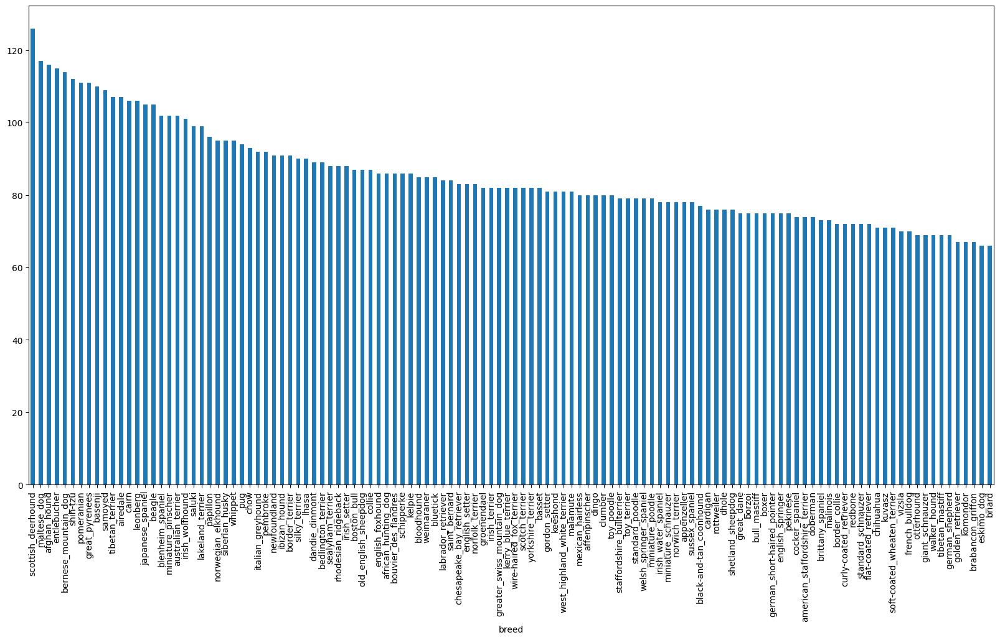

In [5]:
labels_csv['breed'].value_counts().plot.bar(figsize=(20, 10));

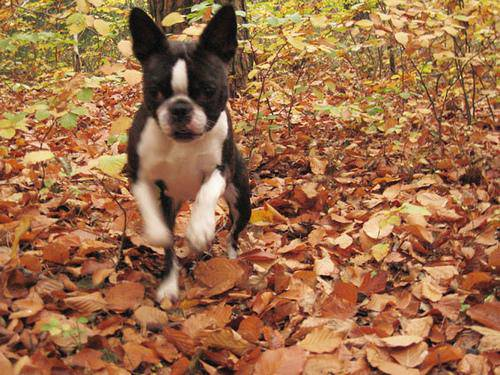

In [6]:
from IPython.display import Image

Image("/content/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

In [7]:
filenames = ["Dog Vision/train/" + fname + ".jpg" for fname in labels_csv['id']]
filenames[:10]

['Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [8]:
import os

os.listdir("Dog Vision/train")[:10]

['b02fdd22c35b59fc509d27e1f5d02373.jpg',
 '0a135c5ee55edf4bd9631d4e15264788.jpg',
 '098dc5e173d21c229e6ee565d7666b10.jpg',
 'fa1a19bd9f99b862cb0a986cbc0ea803.jpg',
 'c4a70cc9be80f67614e4cb0a756f28a5.jpg',
 'ef761ccf005b7bb9bd6a094df7e07df5.jpg',
 '2988284e39fbc91db0dbeedbd8c7555e.jpg',
 '80a4f9b1d472cc5e55b3ebddcc1d8619.jpg',
 'cd714df1f1977466537bbf2fcbbcf0d9.jpg',
 'a3c86eed8bd50060f0d3e8d03c600087.jpg']

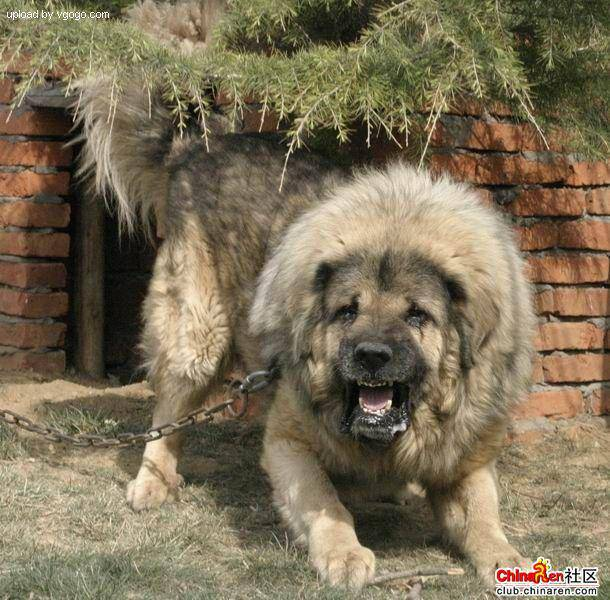

In [9]:
Image(filenames[9000])

In [10]:
import numpy as np

labels = labels_csv['breed'].to_numpy()
labels, len(labels)

(array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
        'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object),
 10222)

In [11]:
len(labels) == len(filenames)

True

In [12]:
unique_breeds = np.unique(labels)
len(unique_breeds), unique_breeds

(120,
 array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
        'american_staffordshire_terrier', 'appenzeller',
        'australian_terrier', 'basenji', 'basset', 'beagle',
        'bedlington_terrier', 'bernese_mountain_dog',
        'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
        'bluetick', 'border_collie', 'border_terrier', 'borzoi',
        'boston_bull', 'bouvier_des_flandres', 'boxer',
        'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
        'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
        'chow', 'clumber', 'cocker_spaniel', 'collie',
        'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
        'doberman', 'english_foxhound', 'english_setter',
        'english_springer', 'entlebucher', 'eskimo_dog',
        'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
        'german_short-haired_pointer', 'giant_schnauzer',
        'golden_retriever', 'gordon_setter'

In [13]:
boolean_labels = [breed == unique_breeds for breed in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [14]:
X = filenames
y = boolean_labels

In [15]:
NUM_IMAGES = 1000

In [16]:
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)
len(X_train), len(X_val), len(y_train), len(y_val)

(8177, 2045, 8177, 2045)

In [17]:
y_train[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False,  True, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [18]:
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  51],
        [ 97,  88,  47],
        [120, 111,  70]]], dtype=uint8)
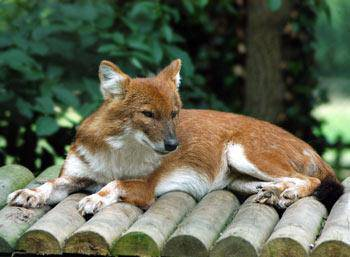

In [19]:
image

In [20]:
IMG_SIZE = 224

def process_image(image_path):
    image = tf.io.read_file(image_path)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.image.convert_image_dtype(image, tf.float32)
    image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])
    return image

In [21]:
tf.io.read_file(filenames[42])

<tf.Tensor: shape=(), dtype=string, numpy=b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\n\x07\x07\x08\x07\x06\n\x08\x08\x08\x0b\n\n\x0b\x0e\x18\x10\x0e\r\r\x0e\x1d\x15\x16\x11\x18#\x1f%$"\x1f"!&+7/&)4)!"0A149;>>>%.DIC<H7=>;\xff\xdb\x00C\x01\n\x0b\x0b\x0e\r\x0e\x1c\x10\x10\x1c;("(;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;\xff\xc0\x00\x11\x08\x01\x01\x01^\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1f\x00\x00\x01\x05\x01\x01\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\x03\x04\x05\x06\x07\x08\t\n\x0b\xff\xc4\x00\xb5\x10\x00\x02\x01\x03\x03\x02\x04\x03\x05\x05\x04\x04\x00\x00\x01}\x01\x02\x03\x00\x04\x11\x05\x12!1A\x06\x13Qa\x07"q\x142\x81\x91\xa1\x08#B\xb1\xc1\x15R\xd1\xf0$3br\x82\t\n\x16\x17\x18\x19\x1a%&\'()*456789:CDEFGHIJSTUVWXYZcdefghijstuvwxyz\x83\x84\x85\x86\x87\x88\x89\x8a\x92\x93\x94\x95\x96\x97\x98\x99\x9a\xa2\xa3\xa4\xa5\xa6\xa7\xa8\xa9\xaa\xb2\xb3\xb4\xb5\xb6\xb7\xb8\xb9\xba\xc2\xc3\xc4\xc5\xc6\xc7\xc8\xc9\xca

In [22]:
tf.image.decode_jpeg(tf.io.read_file(filenames[42]))

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 88, 138,  87],
        [ 75, 125,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  84],
        [ 76, 134,  86],
        [ 75, 133,  85]],

       [[ 71, 120,  73],
        [ 65, 115,  66],
        [ 62, 112,  63],
        ...,
        [ 73, 131,  83],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 54, 105,  64],
        [ 56, 107,  66],
        [ 62, 113,  72],
        ...,
        [ 70, 127,  82],
        [ 71, 128,  83],
        [ 72, 129,  84]],

       ...,

       [[  2,  11,  10],
        [  4,  13,  10],
        [  6,  15,  12],
        ...,
        [119, 112,  66],
        [125, 119,  71],
        [121, 115,  67]],

       [[  0,   3,   7],
        [  0,   7,   9],
        [  2,   8,   4],
        ...,
        [104,  97,  51],
        [111, 104,  58],
        [109, 102,  56]],

       [[ 16,  18,  30],
        [ 14,  19,  23],
        [ 15,  20,  13],
        ...,
        [ 99,  92,  4

In [23]:
tf.image.convert_image_dtype(image, tf.float32)

<tf.Tensor: shape=(257, 350, 3), dtype=float32, numpy=
array([[[0.34901962, 0.5372549 , 0.34901962],
        [0.29803923, 0.48627454, 0.29803923],
        [0.24705884, 0.43529415, 0.2392157 ],
        ...,
        [0.3019608 , 0.52156866, 0.3372549 ],
        [0.29803923, 0.5254902 , 0.3372549 ],
        [0.29803923, 0.5254902 , 0.3372549 ]],

       [[0.28235295, 0.4666667 , 0.29411766],
        [0.2627451 , 0.44705886, 0.26666668],
        [0.24705884, 0.43137258, 0.2509804 ],
        ...,
        [0.29411766, 0.5137255 , 0.32941177],
        [0.2901961 , 0.5176471 , 0.32941177],
        [0.2901961 , 0.5176471 , 0.32941177]],

       [[0.21960786, 0.40784317, 0.25882354],
        [0.227451  , 0.4156863 , 0.26666668],
        [0.2509804 , 0.43921572, 0.2901961 ],
        ...,
        [0.2784314 , 0.49803925, 0.32156864],
        [0.28627452, 0.5058824 , 0.32941177],
        [0.2901961 , 0.50980395, 0.33333334]],

       ...,

       [[0.00784314, 0.04313726, 0.03921569],
        [0.01

In [24]:
def get_image_label(image_path, label):
    image = process_image(image_path)
    return image, label

In [25]:
(process_image(X_train[42]), y_train[42])

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.68747   , 0.6796269 , 0.6286465 ],
         [0.63583183, 0.6279887 , 0.5770083 ],
         [0.7515982 , 0.74375504, 0.69277465],
         ...,
         [0.7820691 , 0.75069654, 0.7075592 ],
         [0.80179256, 0.77041996, 0.7272827 ],
         [0.71689   , 0.68551743, 0.6423801 ]],
 
        [[0.7558424 , 0.74799925, 0.6970188 ],
         [0.8070329 , 0.79918975, 0.7482093 ],
         [0.7359857 , 0.72814256, 0.6771622 ],
         ...,
         [0.8032915 , 0.77191895, 0.72878164],
         [0.7656365 , 0.7342639 , 0.69112664],
         [0.8002115 , 0.76883894, 0.72570163]],
 
        [[0.73219043, 0.72434723, 0.67336684],
         [0.74223566, 0.7343925 , 0.68341213],
         [0.767921  , 0.76007783, 0.7090974 ],
         ...,
         [0.7827322 , 0.75135964, 0.7082223 ],
         [0.7653551 , 0.7339825 , 0.69084525],
         [0.7749511 , 0.7435785 , 0.70044124]],
 
        ...,
 
        [[0.6743428 , 0.64297026

In [26]:
BATCH_SIZE = 32

def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
    if test_data:
        data = tf.data.Dataset.from_tensor_slices((tf.constant(X)))
        data_batch = data.map(process_image).batch(batch_size)
    elif valid_data:
        data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                                   tf.constant(y)))
        data_batch = data.map(get_image_label).batch(batch_size)
    else:
        data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                                   tf.constant(y)))
        data = data.shuffle(buffer_size=len(X))
        data_batch = data.map(get_image_label).batch(batch_size)

    return data_batch

In [27]:
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

In [28]:
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

In [29]:
import matplotlib.pyplot as plt

def show_25_images(images, labels):
    plt.figure(figsize=(10, 10))
    for i in range(25):
        ax = plt.subplot(5, 5, i+1)
        plt.imshow(images[i])
        plt.title(unique_breeds[labels[i].argmax()])
        plt.axis("off")

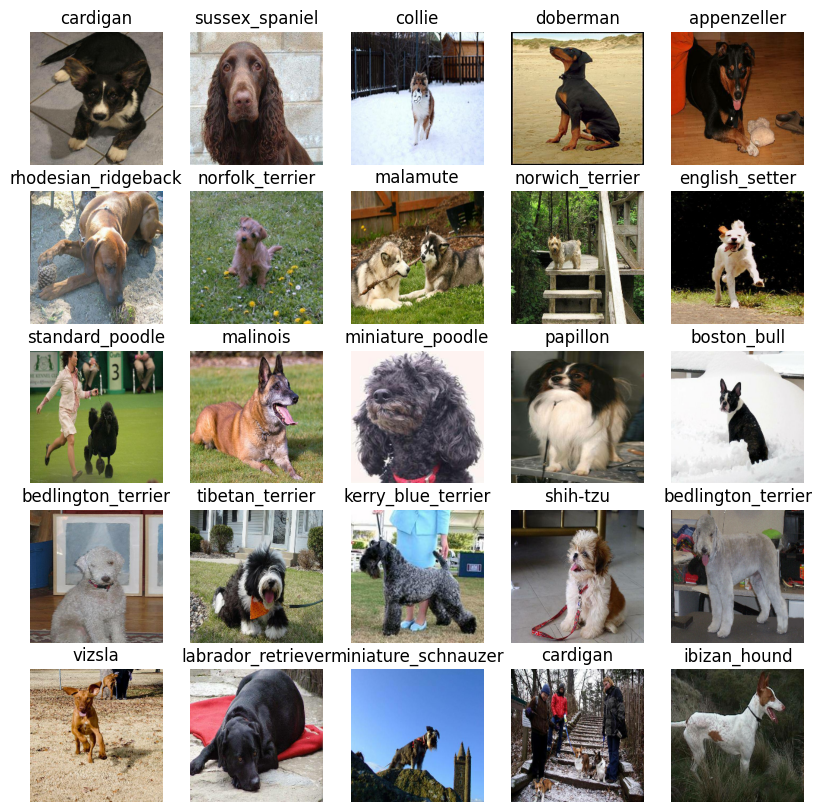

In [30]:
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

In [31]:
len(train_images), len(train_data)

(32, 256)

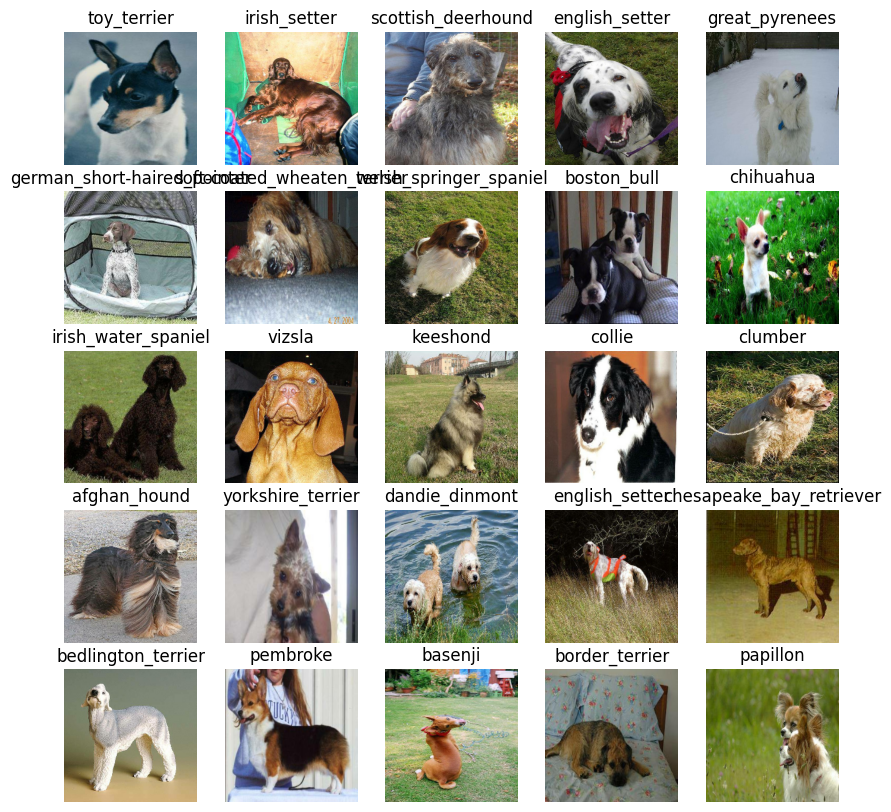

In [32]:
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

In [33]:
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3]
OUTPUT_SHAPE = len(unique_breeds)
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

In [34]:
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
    model = tf.keras.Sequential([
        hub.KerasLayer(model_url),
        tf.keras.layers.Dense(units=OUTPUT_SHAPE, activation="softmax")
    ])

    model.compile(
        loss=tf.keras.losses.CategoricalCrossentropy(),
        optimizer=tf.keras.optimizers.Adam(),
        metrics=["accuracy"]
    )

    model.build(input_shape)
    return model

In [35]:
model = create_model()
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


In [36]:
%load_ext tensorboard

In [37]:
import datetime

def create_tensorboard_callback():
    logdir = os.path.join("Dog Vision/logs",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
    tensorboard_callback = tf.keras.callbacks.TensorBoard(logdir)
    print(f"Saving TensorBoard log files to: {logdir}")
    return tensorboard_callback

In [38]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy',
                                                  patience=3)

In [39]:
NUM_EPOCHS = 100

In [40]:
def train_model():
    model = create_model()
    tensorboard = create_tensorboard_callback()
    model.fit(x=train_data,
              epochs=NUM_EPOCHS,
              validation_data=val_data,
              validation_freq=1,
              callbacks=[tensorboard, early_stopping])
    return model

In [41]:
model = train_model()

Saving TensorBoard log files to: Dog Vision/logs/20250303-142250
Epoch 1/100
256/256 [==============================] - 479s 2s/step - loss: 1.4936 - accuracy: 0.6442 - val_loss: 0.7091 - val_accuracy: 0.7961
Epoch 2/100
256/256 [==============================] - 411s 2s/step - loss: 0.4165 - accuracy: 0.8799 - val_loss: 0.6358 - val_accuracy: 0.8117
Epoch 3/100
256/256 [==============================] - 416s 2s/step - loss: 0.2340 - accuracy: 0.9434 - val_loss: 0.6292 - val_accuracy: 0.8098
Epoch 4/100
256/256 [==============================] - 406s 2s/step - loss: 0.1507 - accuracy: 0.9670 - val_loss: 0.6373 - val_accuracy: 0.8083
Epoch 5/100
256/256 [==============================] - 408s 2s/step - loss: 0.1022 - accuracy: 0.9815 - val_loss: 0.6424 - val_accuracy: 0.8112


In [42]:
%tensorboard --logdir Dog\ Vision/logs

<IPython.core.display.Javascript object>

In [43]:
predictions = model.predict(val_data, verbose=1)
predictions

64/64 [==============================] - 83s 1s/step


array([[1.6099840e-07, 5.3588519e-08, 2.4172768e-06, ..., 6.5876770e-07,
        4.3254907e-04, 1.7676213e-05],
       [2.0523977e-07, 3.5634272e-05, 4.9076630e-07, ..., 2.3041446e-07,
        2.8771540e-08, 3.2619115e-05],
       [5.6905554e-07, 5.9363516e-05, 3.9204101e-06, ..., 4.9401732e-04,
        4.3387149e-04, 1.7929111e-05],
       ...,
       [6.9955075e-07, 7.1900547e-05, 1.5977853e-06, ..., 4.6952587e-07,
        9.2156179e-06, 6.4092790e-05],
       [3.2150205e-09, 2.6743314e-07, 5.1787939e-08, ..., 5.0325135e-09,
        1.4705645e-07, 9.9963291e-09],
       [2.1292196e-06, 2.2153378e-07, 2.0345269e-06, ..., 5.0134821e-07,
        3.3527800e-07, 1.9996891e-07]], dtype=float32)

In [44]:
predictions.shape

(2045, 120)

In [45]:
index = 42
print(predictions[index])
print(f"Max prob: {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[1.46547805e-07 1.70375554e-08 7.42217878e-08 1.64087879e-07
 2.73774560e-07 3.34811157e-05 2.97480057e-07 2.09800760e-07
 4.35963798e-08 1.66921232e-08 5.95245560e-08 9.94474590e-01
 4.76191220e-09 1.73494263e-05 3.54162388e-08 2.13543785e-06
 7.26817816e-05 7.53674954e-07 3.01841794e-07 3.62034916e-06
 1.08994174e-08 3.44156241e-08 2.25420074e-08 2.33200780e-07
 3.61498593e-07 8.57590194e-08 1.90223068e-06 5.94031462e-06
 1.61019980e-08 4.57155522e-08 3.06240531e-06 5.13640498e-06
 1.70197982e-05 4.20947064e-04 2.79215044e-07 1.87033889e-04
 4.83679266e-08 1.17543419e-09 4.30919833e-09 1.65266512e-09
 7.30411239e-06 9.16092995e-06 2.36907181e-06 3.42725770e-07
 2.91506585e-05 6.59527132e-07 7.70816122e-09 5.50610579e-09
 1.40534848e-06 1.79278220e-06 4.21915229e-06 2.34638109e-09
 1.01108308e-05 3.66900512e-03 8.48739532e-08 2.24833521e-08
 2.09419646e-08 2.92306368e-07 6.80013157e-09 6.45212083e-07
 6.78628354e-08 8.35063588e-07 8.85509053e-07 2.72063119e-08
 2.22726282e-08 3.105138

In [46]:
unique_breeds[42]

'entlebucher'

In [47]:
def get_pred_label(predictions):
    return np.array(unique_breeds[np.argmax(predictions)])

In [49]:
pred_label = get_pred_label(predictions[81])
pred_label

array('greater_swiss_mountain_dog', dtype='<U26')

In [50]:
images = []
labels = []

for image, label in val_data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(label)

images[0], labels[0]

(array([[[0.4615459 , 0.5478204 , 0.60272235],
         [0.4615459 , 0.5478204 , 0.60272235],
         [0.45909494, 0.5453694 , 0.60027134],
         ...,
         [0.41813728, 0.5083334 , 0.56323534],
         [0.4156863 , 0.5058824 , 0.56078434],
         [0.4156863 , 0.5058824 , 0.56078434]],
 
        [[0.45522588, 0.5415004 , 0.59640235],
         [0.45522588, 0.5415004 , 0.59640235],
         [0.4527749 , 0.5390494 , 0.59395134],
         ...,
         [0.41813728, 0.5083334 , 0.56323534],
         [0.4156863 , 0.5058824 , 0.56078434],
         [0.4156863 , 0.5058824 , 0.56078434]],
 
        [[0.45098042, 0.5372549 , 0.5921569 ],
         [0.45098042, 0.5372549 , 0.5921569 ],
         [0.44852945, 0.5348039 , 0.5897059 ],
         ...,
         [0.41813728, 0.5083334 , 0.56323534],
         [0.4156863 , 0.5058824 , 0.56078434],
         [0.4156863 , 0.5058824 , 0.56078434]],
 
        ...,
 
        [[0.18869358, 0.32987005, 0.42398772],
         [0.1894466 , 0.33062306, 0.42179

In [51]:
def unbatchify(data):
    images = []
    labels = []
    for image, label in data.unbatch().as_numpy_iterator():
        images.append(image)
        labels.append(unique_breeds[np.argmax(label)])
    return images, labels

In [52]:
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.4615459 , 0.5478204 , 0.60272235],
         [0.4615459 , 0.5478204 , 0.60272235],
         [0.45909494, 0.5453694 , 0.60027134],
         ...,
         [0.41813728, 0.5083334 , 0.56323534],
         [0.4156863 , 0.5058824 , 0.56078434],
         [0.4156863 , 0.5058824 , 0.56078434]],
 
        [[0.45522588, 0.5415004 , 0.59640235],
         [0.45522588, 0.5415004 , 0.59640235],
         [0.4527749 , 0.5390494 , 0.59395134],
         ...,
         [0.41813728, 0.5083334 , 0.56323534],
         [0.4156863 , 0.5058824 , 0.56078434],
         [0.4156863 , 0.5058824 , 0.56078434]],
 
        [[0.45098042, 0.5372549 , 0.5921569 ],
         [0.45098042, 0.5372549 , 0.5921569 ],
         [0.44852945, 0.5348039 , 0.5897059 ],
         ...,
         [0.41813728, 0.5083334 , 0.56323534],
         [0.4156863 , 0.5058824 , 0.56078434],
         [0.4156863 , 0.5058824 , 0.56078434]],
 
        ...,
 
        [[0.18869358, 0.32987005, 0.42398772],
         [0.1894466 , 0.33062306, 0.42179

In [54]:
def plot_pred(prediction_probabilities, labels, images, n=1):
    pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]
    pred_label = get_pred_label(pred_prob)
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])

    if pred_label == true_label:
        color = 'green'
    else:
        color = 'red'

    plt.title(f"{pred_label} {np.max(pred_prob)*100} {true_label}", color=color)

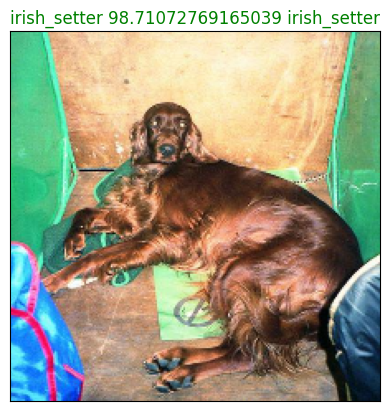

In [55]:
plot_pred(predictions, val_labels, val_images)

In [59]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
    pred_prob, true_label = prediction_probabilities[n], labels[n]
    pred_label = get_pred_label(pred_prob)
    top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
    top_10_pred_values = pred_prob[top_10_pred_indexes]
    top_10_pred_labels = unique_breeds[top_10_pred_indexes]
    top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                       top_10_pred_values,
                       color="grey")
    plt.xticks(np.arange(len(top_10_pred_labels)),
               labels=top_10_pred_labels,
               rotation="vertical")

    if np.isin(true_label, top_10_pred_labels):
        top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
    else:
        pass

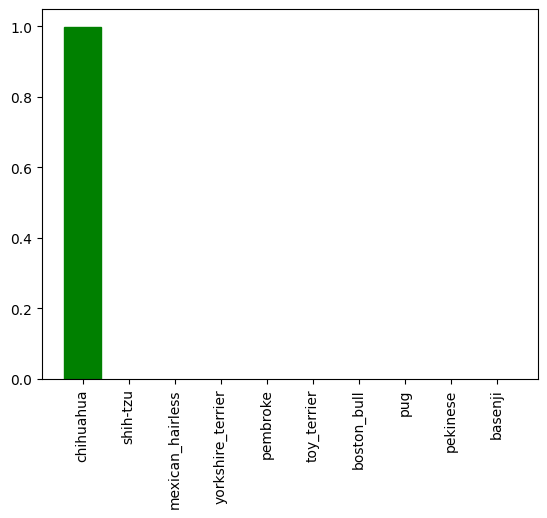

In [60]:
plot_pred_conf(predictions, val_labels, n=9)

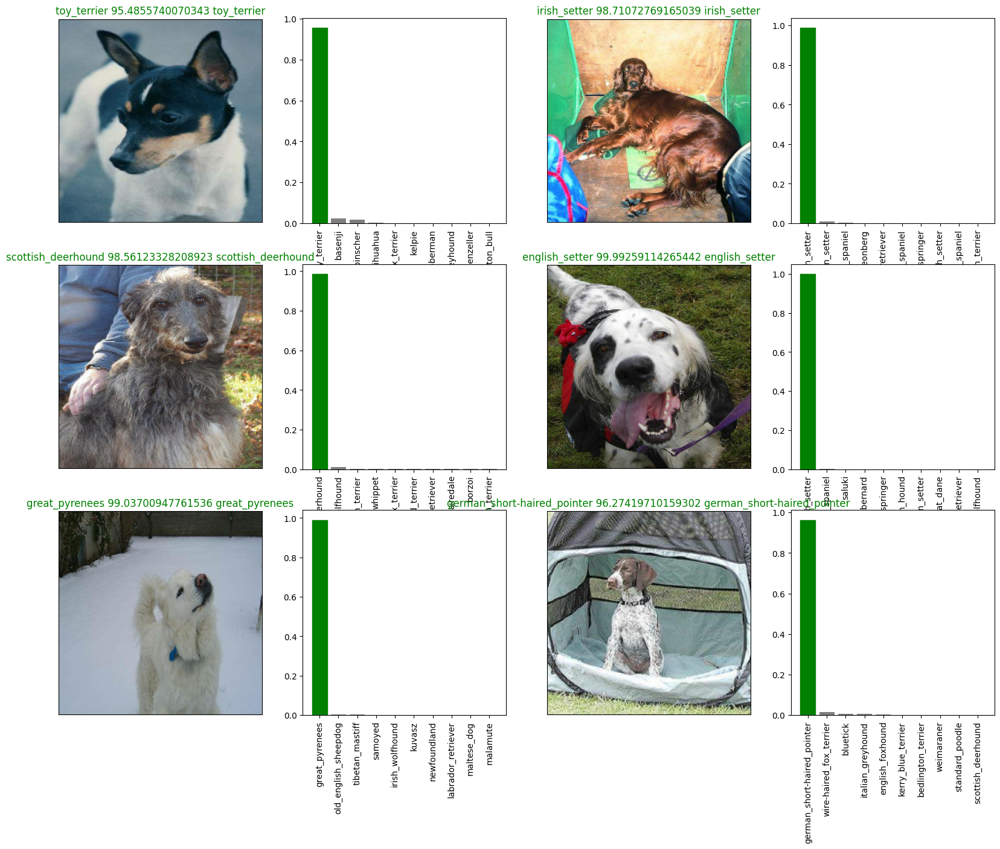

In [61]:
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
    plt.subplot(num_rows, 2*num_cols, 2*i + 1)
    plot_pred(predictions, val_labels, val_images, i + i_multiplier)
    plt.subplot(num_rows, 2*num_cols, 2*i + 2)
    plot_pred_conf(predictions, val_labels, i + i_multiplier)
#plt.tight_layout(h_pad=1.0)
plt.show()

In [ ]:
# confusion matrix

In [62]:
def save_model(model, suffix=None):
    model_dir = os.path.join('Dog Vision/models',
                             datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
    model_path = model_dir + "_" + suffix + ".h5"
    print(f"Saving model to: {model_path}")
    model.save(model_path)
    return model_path

In [63]:
def load_model(model_path):
    print(f"Loading saved model from: {model_path}")
    model = tf.keras.models.load_model(model_path,
                                       custom_objects={"KerasLayer": hub.KerasLayer})
    return model

In [64]:
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: Dog Vision/models/20250303-150636_1000-images-mobilenetv2-Adam.h5


/usr/local/lib/python3.11/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'Dog Vision/models/20250303-150636_1000-images-mobilenetv2-Adam.h5'

In [67]:
loaded_model = load_model("/content/Dog Vision/models/20250303-150636_1000-images-mobilenetv2-Adam.h5")

Loading saved model from: /content/Dog Vision/models/20250303-150636_1000-images-mobilenetv2-Adam.h5


In [68]:
model.evaluate(val_data)

64/64 [==============================] - 85s 1s/step - loss: 0.6424 - accuracy: 0.8112


[0.6423540115356445, 0.811246931552887]

In [69]:
loaded_model.evaluate(val_data)

64/64 [==============================] - 84s 1s/step - loss: 0.6424 - accuracy: 0.8112


[0.6423540115356445, 0.811246931552887]

In [70]:
full_data = create_data_batches(X, y)
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [71]:
full_model = create_model()

In [72]:
full_model_tensorboard = create_tensorboard_callback()
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor='accuracy', patience=3)

Saving TensorBoard log files to: Dog Vision/logs/20250303-151115


In [ ]:
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 415s 1s/step - loss: 1.3316 - accuracy: 0.6707
Epoch 2/100
320/320 [==============================] - 420s 1s/step - loss: 0.4018 - accuracy: 0.8803
Epoch 3/100
320/320 [==============================] - 413s 1s/step - loss: 0.2400 - accuracy: 0.9352
Epoch 4/100
320/320 [==============================] - 412s 1s/step - loss: 0.1527 - accuracy: 0.9643
Epoch 5/100
320/320 [==============================] - 411s 1s/step - loss: 0.1086 - accuracy: 0.9772
Epoch 6/100
320/320 [==============================] - 428s 1s/step - loss: 0.0776 - accuracy: 0.9870
Epoch 7/100
165/320 [==============>...............] - ETA: 3:20 - loss: 0.0544 - accuracy: 0.9939

In [ ]:
save_model(full_model, suffix="full-1000-images-mobilenetv2-Adam")

In [ ]:
loaded_full_model = load_model()

In [ ]:
test_path = 'Dog Vision/test/'
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

In [ ]:
len(test_filenames)

In [ ]:
test_data = create_data_batches(test_filenames, test_data=True)

In [ ]:
test_data

In [ ]:
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

In [ ]:
test_predictions = np.loadtxt("Dog Vision/preds_array.csv", delimiter=',')

In [ ]:
test_predictions.shape

In [ ]:
preds_df = pd.DataFrame(columns=['id'] + list(unique_breeds))
preds_df

In [ ]:
test_ids = [os.path.splittext(path) for path in ps.listdir(test_path)]
test_ids

In [ ]:
preds_df['id'] = test_ids

In [ ]:
preds_df[list(unique_breeds)] = test_prediction
preds_df

In [ ]:
preds_df.to_csv("Dog Vision/preds.csv", index=False)